# OAE: VGGFace2

## Evaluations - Figure

In [1]:
import os
import sys
import logging
import json
import copy
import random
import numpy as np
import pandas as pd

os.environ['CUDA_VISIBLE_DEVICES']='0'
import tensorflow as tf

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import pylab
import PIL
%matplotlib inline

seed_value = 123
os.environ['PYTHONHASHSEED']=str(seed_value)
random.seed(seed_value)
np.random.seed(seed_value)
tf.set_random_seed(seed_value)

from keras.utils import to_categorical
import keras.backend as k

config = tf.ConfigProto(allow_soft_placement=True)
config.gpu_options.allow_growth=True
k.set_session(tf.Session(config=config))

sys.path.append('/'.join(os.getcwd().split('/')))
from ornstein_auto_encoder import configuration
from ornstein_auto_encoder import readers
from ornstein_auto_encoder import samplers
from ornstein_auto_encoder import build_network

/usr/local/lib/python3.6/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


### Set basic variables

In [2]:
logging.getLogger("PIL").setLevel(logging.CRITICAL)
logging.basicConfig(format = '[%(name)-8s|%(levelname)s|%(filename)s:%(lineno)s] %(message)s',
                    level=logging.INFO)
log = logging.getLogger()

In [3]:
fig_dir = "./figures/vggface2"

model_path = 'vggface2_pretrained/vggface2_psoae'
model_aka = 'PSOAE'
path_info_config = "configurations/vggface2/psoae_path_info.cfg"
network_info_config = "configurations/vggface2/psoae_network_total_info.cfg"
feature_b = True

config_data = configuration.Configurator(path_info_config, log, verbose=False)
config_data.set_config_map(config_data.get_section_map())
config_network = configuration.Configurator(network_info_config, log, verbose=False)
config_network.set_config_map(config_network.get_section_map())
path_info = config_data.get_config_map()
network_info = config_network.get_config_map()

architecture = path_info['model_info']['model_architecture']

path_info['model_info']['model_dir'] = model_path
if network_info['model_info']['network_class'] == 'ProductSpaceOAEFixedBHSIC_GAN': 
    network_info['model_info']['network_class'] == 'ProductSpaceOAEHSIC_GAN'
if float(network_info['model_info']['e_weight']) == 0.: network_info['model_info']['e_weight'] = '1.'
if network_info['training_info']['warm_start'] == 'True': 
    network_info['training_info']['warm_start'] = 'False'
    network_info['training_info']['warm_start_model'] = ''
if network_info['model_info']['augment'] == 'True':
    network_info['model_info']['augment'] = 'False'

log.info('%22s : %s' % ('model_aka', model_aka))
log.info('%22s : %s' % ('model_path', model_path))
log.info('%22s : %s' % ('reader', network_info['model_info']['reader_class']))
log.info('%22s : %s' % ('architecture', architecture))

[root    |INFO|<ipython-input-3-d8a2e9af9901>:28]              model_aka : PSOAE
[root    |INFO|<ipython-input-3-d8a2e9af9901>:29]             model_path : vggface2_pretrained/vggface2_psoae
[root    |INFO|<ipython-input-3-d8a2e9af9901>:30]                 reader : VGGFace2Reader
[root    |INFO|<ipython-input-3-d8a2e9af9901>:31]           architecture : ../../architecture/vggface2_z128_psoae/


In [4]:
# Reader
reader_class = getattr(readers, network_info['model_info']['reader_class'].strip())  
reader = reader_class(log, path_info, network_info, mode='train', verbose=True)

[root    |INFO|readers.py:525] -------------------------------------------------
[root    |INFO|readers.py:526] Construct Dataset
[root    |INFO|readers.py:527] -------------------------------------------------
[root    |INFO|readers.py:528] Loading VGG Face 2 dataset information
[root    |INFO|readers.py:530] Set image shape : [128 128   3]
[root    |INFO|readers.py:74] -------------------------------------------------
[root    |INFO|readers.py:75] Images per Class
[root    |INFO|readers.py:76] 
n000810    843
n004806    814
n001586    761
n008328    746
n000270    720
          ... 
n006136    104
n000493    102
n002793    102
n006463    101
n001967     87
Length: 8631, dtype: int64
[root    |INFO|readers.py:77] -------------------------------------------------
[root    |INFO|readers.py:78] Summary
[root    |INFO|readers.py:79] 
count    8631.000000
mean      364.023867
std       101.223157
min        87.000000
25%       293.000000
50%       359.000000
75%       432.000000
max       

In [5]:
### Bulid network ####################################################################################
log.info('-----------------------------------------------------------------')
print(''.join(network_info['model_info']['network_class'].strip().split('FixedB')))
network_class = getattr(build_network, ''.join(network_info['model_info']['network_class'].strip().split('FixedB')))  
network = network_class(log, path_info, network_info, n_label=reader.get_n_label())
network.build_model('./%s/%s' % (model_path,  path_info['model_info']['model_architecture']), verbose=2)
network.load(model_path)
log.info('-----------------------------------------------------------------')

[root    |INFO|<ipython-input-5-1d1c1a942fd4>:2] -----------------------------------------------------------------


ProductSpaceOAEHSIC_GAN
Instructions for updating:
If using Keras pass *_constraint arguments to layers.


[tensorflow|WARNING|deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorflow_core/python/ops/resource_variable_ops.py:1630: calling BaseResourceVariable.__init__ (from tensorflow.python.ops.resource_variable_ops) with constraint is deprecated and will be removed in a future version.
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
[root    |INFO|_build_base_network.py:75] encoder_base.yaml
[root    |INFO|layer_utils.py:112] Model: "encoder_base"
[root    |INFO|layer_utils.py:113] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|layer_utils.py:110] Layer (type)                                                                              Output Shape                                                                    Param #                       
[root    |INFO|layer_utils.p

[root    |INFO|layer_utils.py:110] e5_activation (Activation)                                                                (None, 8, 8, 256)                                                               0                             
[root    |INFO|layer_utils.py:177] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|layer_utils.py:110] flatten (Flatten)                                                                         (None, 16384)                                                                   0                             
[root    |INFO|layer_utils.py:177] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|layer_utils.py:110] pre_h_dense (Dense)  

[root    |INFO|layer_utils.py:175] ========================================================================================================================================================================================================
[root    |INFO|layer_utils.py:188] Total params: 435,904
[root    |INFO|layer_utils.py:189] Trainable params: 435,264
[root    |INFO|layer_utils.py:190] Non-trainable params: 640
[root    |INFO|layer_utils.py:191] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|_build_base_network.py:75] encoder_e.yaml
[root    |INFO|layer_utils.py:112] Model: "encoder_e"
[root    |INFO|layer_utils.py:113] ________________________________________________________________________________________________________________________________________________________________________________________________________
[r

[root    |INFO|layer_utils.py:110] d1_conv (Conv2DTranspose)                                                                 (None, 16, 16, 256)                                                             3277056                       
[root    |INFO|layer_utils.py:177] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|layer_utils.py:110] d1_bn (BatchNormalization)                                                                (None, 16, 16, 256)                                                             1024                          
[root    |INFO|layer_utils.py:177] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|layer_utils.py:110] d1_activation (Activa

[root    |INFO|layer_utils.py:191] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|_build_base_network.py:75] discriminator.yaml
[root    |INFO|layer_utils.py:112] Model: "discriminator"
[root    |INFO|layer_utils.py:113] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|layer_utils.py:110] Layer (type)                                                                              Output Shape                                                                    Param #                       
[root    |INFO|layer_utils.py:115] ==========================================================================================================================================

[root    |INFO|layer_utils.py:177] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|layer_utils.py:110] encoder_b_model (Model)                                           [(None, 64), (None, 64), (None, 64)]        435904                  feature_b_input[0][0]                                             
[root    |INFO|layer_utils.py:110]                                                                                                                                       class_info_input[0][0]                                            
[root    |INFO|layer_utils.py:177] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|layer_utils.py:110] encoder_e_model (Mode

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


[tensorflow|WARNING|deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_core/python/ops/nn_impl.py:183: where (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Instructions for updating:
keep_dims is deprecated, use keepdims instead


[tensorflow|WARNING|deprecation.py:506] From /home/muha/wrapped_code/ornstein_auto_encoder_supplement/code/ornstein_auto_encoder/ops.py:300: calling reduce_sum_v1 (from tensorflow.python.ops.math_ops) with keep_dims is deprecated and will be removed in a future version.
Instructions for updating:
keep_dims is deprecated, use keepdims instead


[tensorflow|WARNING|module_wrapper.py:139] From /home/muha/wrapped_code/ornstein_auto_encoder_supplement/code/ornstein_auto_encoder/ops.py:352: The name tf.is_nan is deprecated. Please use tf.math.is_nan instead.

[root    |INFO|build_network.py:155] Generative sample blurr model
[root    |INFO|layer_utils.py:112] Model: "gen_blurr_model"
[root    |INFO|layer_utils.py:113] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|layer_utils.py:110] Layer (type)                                                                              Output Shape                                                                    Param #                       
[root    |INFO|layer_utils.py:115] ========================================================================================================================================================

[root    |INFO|layer_utils.py:110] class_info_input (InputLayer)                                     (None, 1)                                   0                                                                                         
[root    |INFO|layer_utils.py:177] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|layer_utils.py:110] encoder_b_model (Model)                                           [(None, 64), (None, 64), (None, 64)]        435904                  feature_b_input[0][0]                                             
[root    |INFO|layer_utils.py:110]                                                                                                                                       class_info_input[0][0]                                            
[root    |INFO|layer_utils.py:177] _____________________

[root    |INFO|layer_utils.py:177] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|layer_utils.py:110] feature_b_input (InputLayer)                                      (None, 2048)                                0                                                                                         
[root    |INFO|layer_utils.py:177] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|layer_utils.py:110] class_info_input (InputLayer)                                     (None, 1)                                   0                                                                                         
[root    |INFO|layer_utils.py:177] _____________________

[root    |INFO|layer_utils.py:177] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|layer_utils.py:110] encoder_z_model (Model)                                           (None, 192)                                 0                       encoder_b_model[1][0]                                             
[root    |INFO|layer_utils.py:110]                                                                                                                                       encoder_e_model[1][0]                                             
[root    |INFO|layer_utils.py:177] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|layer_utils.py:110] decoder (Model)      

[root    |INFO|layer_utils.py:110]                                                                                                                                       feature_b_input[0][0]                                             
[root    |INFO|layer_utils.py:110]                                                                                                                                       class_info_input[0][0]                                            
[root    |INFO|layer_utils.py:177] ________________________________________________________________________________________________________________________________________________________________________________________________________
[root    |INFO|layer_utils.py:110] discriminator_e (Model)                                           (None, 1)                                   854529                  prior_e_input[0][0]                                               
[root    |INFO|layer_utils.py:110]                      

# Result (identities used in training)

In [6]:
# Training
train_tot_idxs_path = os.path.join(model_path, path_info['model_info']['train_tot_idxs'])
test_tot_idxs_path = os.path.join(model_path, path_info['model_info']['test_tot_idxs'])
train_idx = np.load(train_tot_idxs_path)
test_idx = np.load(test_tot_idxs_path)

### Sampler ##########################################################################################
log.info('-----------------------------------------------------------------')
# Test data sampler
log.info('Construct test data sampler')
validation_sampler_class = getattr(samplers, network_info['validation_info']['sampler_class'].strip())
test_sampler = validation_sampler_class(log, test_idx, reader, network_info['validation_info'], verbose=True)
test_generator = samplers.train_generator(test_sampler)

[root    |INFO|<ipython-input-6-844ab50f4c63>:8] -----------------------------------------------------------------
[root    |INFO|<ipython-input-6-844ab50f4c63>:10] Construct test data sampler
[root    |INFO|samplers.py:109] -------------------------------------------------
[root    |INFO|samplers.py:110] Images per Class
[root    |INFO|samplers.py:111] 
n000810    168
n008388    159
n004806    156
n008223    152
n001586    152
          ... 
n007864     17
n008469     17
n004463     16
n002793     16
n001967     11
Length: 8631, dtype: int64
[root    |INFO|samplers.py:112] -------------------------------------------------
[root    |INFO|samplers.py:113] Summary
[root    |INFO|samplers.py:114] 
count    8631.000000
mean       72.804773
std        21.569731
min        11.000000
25%        58.000000
50%        72.000000
75%        87.000000
max       168.000000
dtype: float64
[root    |INFO|samplers.py:115] -------------------------------------------------


In [7]:
nunit = 15
nobservations = 10
picked_y_class = np.random.choice(test_sampler.y_class, nunit, replace=False)

test_idxs = []
picked_one_shot_idxs = []
for yc in picked_y_class:
    chosen_observations = np.random.choice(test_sampler.train_idx[test_sampler.y_index.get_loc(yc)], nobservations)
    test_idxs.append(chosen_observations) # 10 observatoins for unit
    picked_one_shot_idxs.append(np.random.choice(np.arange(nobservations), 1)[0])
test_idxs = np.array(test_idxs).flatten()
picked_one_shot_idxs = np.array(picked_one_shot_idxs)

nunit = 15
nobservations = 10
picked_y_class = np.random.choice(test_sampler.y_class, nunit, replace=False)
test_idxs = []
picked_one_shot_idxs = []
for yc in picked_y_class:
    chosen_observations = np.random.choice(test_sampler.train_idx[test_sampler.y_index.get_loc(yc)], nobservations)
    test_idxs.append(chosen_observations) # 10 observatoins for unit
    picked_one_shot_idxs.append(np.random.choice(np.arange(nobservations), 1)[0])
test_idxs = np.array(test_idxs).flatten()
picked_one_shot_idxs = np.array(picked_one_shot_idxs)

x, y = test_sampler.reader.get_batch(test_idxs)

y_table = pd.Series(y)
y_index = pd.Index(y)
y_class = y_table.unique()
y_table = pd.Series(y)
y_counts = y_table.value_counts()
log.info('-------------------------------------------------')
log.info('Images per Class')
log.info('\n%s', y_counts)
log.info('-------------------------------------------------')
log.info('Summary')
log.info('\n%s', y_counts.describe())
log.info('-------------------------------------------------')


wx, wy = network.main_sampler(x,y)

[root    |INFO|<ipython-input-7-a0a540750b9e>:33] -------------------------------------------------
[root    |INFO|<ipython-input-7-a0a540750b9e>:34] Images per Class
[root    |INFO|<ipython-input-7-a0a540750b9e>:35] 
6910    10
4851    10
6127    10
1237    10
704     10
6844    10
7342    10
5250    10
6262    10
4684    10
3642    10
2860    10
2328    10
534     10
4629    10
dtype: int64
[root    |INFO|<ipython-input-7-a0a540750b9e>:36] -------------------------------------------------
[root    |INFO|<ipython-input-7-a0a540750b9e>:37] Summary
[root    |INFO|<ipython-input-7-a0a540750b9e>:38] 
count    15.0
mean     10.0
std       0.0
min      10.0
25%      10.0
50%      10.0
75%      10.0
max      10.0
dtype: float64
[root    |INFO|<ipython-input-7-a0a540750b9e>:39] -------------------------------------------------


In [8]:
if ('randomintercept' in network_info['model_info']['network_class'].lower() or \
    'productspace' in network_info['model_info']['network_class'].lower()):
    recon_x = network.ae_model.predict(wx[:-1], batch_size=100)
elif ('conditional' in network_info['model_info']['network_class'].lower()):
    recon_x = network.ae_model.predict(wx, batch_size=100)
else:
    recon_x = network.ae_model.predict(wx[:1], batch_size=100)
try:
    if len(x.shape) == 4: real_img = x
except: real_img = x[0]

repeated = 20
esp = 1.
gen_y_class = np.repeat(y_class, repeated, axis=0)

picked_one_shot_idxs_per_class = np.array([np.where(y==cls)[0][picked_one_shot_idxs[i]] for i, cls in enumerate(y_class)])
if 'randomintercept' in network_info['model_info']['network_class'].lower():
    b_sd = float(network_info['model_info']['b_sd'])
    estimate_b, fake_noise = network.encoder_model.predict(x, batch_size=100)
    new_b = np.random.multivariate_normal(np.zeros(network.get_z_dim()),
                                          b_sd**2.*np.identity(network.get_z_dim()), 
                                          y_class.shape[0]).astype(np.float32)
    b = np.array([np.mean(estimate_b[np.random.choice(np.where(y==cls)[0],5)], axis=0) for cls in y_class])
    one_shot_b = np.array([estimate_b[picked_one_shot_idxs_per_class[i]] for i, cls in enumerate(y_class)])
    fake_latent = estimate_b + fake_noise
elif 'productspace' in network_info['model_info']['network_class'].lower():
    if feature_b: img, feature, clss, b_noise = wx
    else: img, clss, b_noise = wx
    b_sd = float(network_info['model_info']['b_sd'])
      
    if feature_b:
        sample_b, b_given_x, estimate_b  = network.encoder_b_model.predict_on_batch([feature, clss])
    else:
        sample_b, b_given_x, estimate_b  = network.encoder_b_model.predict_on_batch([img, clss])
        
    b = np.array([np.mean(estimate_b[np.random.choice(np.where(y==cls)[0],5)], axis=0) for cls in y_class])
    fake_noise = network.encoder_e_model.predict(wx[:-1], batch_size=100)
    new_b = np.random.multivariate_normal(np.zeros(b.shape[-1]), 
                                          b_sd**2.*np.identity(b.shape[-1]), 
                                          y_class.shape[0]).astype(np.float32)
    one_shot_b = np.array([estimate_b[picked_one_shot_idxs_per_class[i]] for i, cls in enumerate(y_class)])
else:
    fake_latent = network.encoder_model.predict(x, batch_size=100)
    fake_noise = fake_latent
    
mean = np.zeros(fake_noise.shape[-1])
cov = float(network_info['model_info']['e_sd'])**2.*np.identity(fake_noise.shape[-1])
true_noise = np.random.multivariate_normal(mean,cov,y.shape[0]).astype(np.float32)
mean = np.zeros(fake_noise.shape[-1])
cov = esp*np.identity(fake_noise.shape[-1])
noise = np.random.multivariate_normal(mean,cov,y_class.shape[0]*repeated).astype(np.float32)

tiled_noise = np.random.multivariate_normal(mean,cov,repeated).astype(np.float32)
tiled_noise[0,:] = 0.
tiled_noise = np.tile(tiled_noise, (y_class.shape[0],1))

if 'randomintercept' in network_info['model_info']['network_class'].lower():
    generated_images = network.decoder_model.predict(noise + np.repeat(b, repeated, axis=0),  batch_size=100)
    tiled_generated_images = network.decoder_model.predict(tiled_noise + np.repeat(b, repeated, axis=0), batch_size=100)
    prototype_images = network.decoder_model.predict(np.repeat(b, repeated, axis=0), batch_size=100)
    one_shot_prototype_images = network.decoder_model.predict(np.repeat(one_shot_b, repeated, axis=0), batch_size=100)
    one_shot_generated_images = network.decoder_model.predict(noise + np.repeat(one_shot_b, repeated, axis=0), batch_size=100)
    tiled_one_shot_generated_images = network.decoder_model.predict(tiled_noise + np.repeat(one_shot_b, repeated, axis=0),
                                                                    batch_size=100)
    tiled_new_generated_images = network.decoder_model.predict(tiled_noise + np.repeat(new_b, repeated, axis=0), batch_size=100)
elif 'productspace' in network_info['model_info']['network_class'].lower():
    generated_images = network.decoder_model.predict(np.concatenate([np.repeat(b, repeated, axis=0), noise], axis=-1),
                                                     batch_size=100)
    tiled_generated_images = network.decoder_model.predict(np.concatenate([np.repeat(b, repeated, axis=0), tiled_noise], axis=-1),
                                                           batch_size=100)
    prototype_images = network.decoder_model.predict(np.concatenate([np.repeat(b, repeated, axis=0), np.zeros_like(noise)], axis=-1),
                                                     batch_size=100)
    one_shot_prototype_images = network.decoder_model.predict(np.concatenate([np.repeat(one_shot_b, repeated, axis=0), np.zeros_like(noise)],
                                                                    axis=-1),
                                                     batch_size=100)
    one_shot_generated_images = network.decoder_model.predict(np.concatenate([np.repeat(one_shot_b, repeated, axis=0), noise], axis=-1),
                                                              batch_size=100)
    tiled_one_shot_generated_images = network.decoder_model.predict(np.concatenate([np.repeat(one_shot_b, repeated, axis=0), tiled_noise], axis=-1),
                                                                    batch_size=100)
    tiled_new_generated_images = network.decoder_model.predict(np.concatenate([np.repeat(new_b, repeated, axis=0), tiled_noise], axis=-1),
                                                               batch_size=100)
elif 'conditional' in network_info['model_info']['network_class'].lower():
    generated_images = network.decoder_model.predict([noise, to_categorical(gen_y_class, reader.get_n_label())], batch_size=100)
    prototype_images = network.decoder_model.predict([np.zeros_like(noise),
                                                      to_categorical(gen_y_class, reader.get_n_label())], batch_size=100)
    tiled_generated_images = network.decoder_model.predict([tiled_noise, to_categorical(gen_y_class, reader.get_n_label())],
                                                           batch_size=100)
else:
    generated_images = network.decoder_model.predict(noise, batch_size=100)
    tiled_generated_images = network.decoder_model.predict(tiled_noise, batch_size=100)

[tensorflow|WARNING|module_wrapper.py:139] From /home/muha/.local/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:422: The name tf.global_variables is deprecated. Please use tf.compat.v1.global_variables instead.



### Reconstruction of the Test Data

[root    |INFO|<ipython-input-9-01c8dfb56664>:22] origin_sharpness : 0.012467304
[root    |INFO|<ipython-input-9-01c8dfb56664>:23] recon_sharpness : 0.004327916


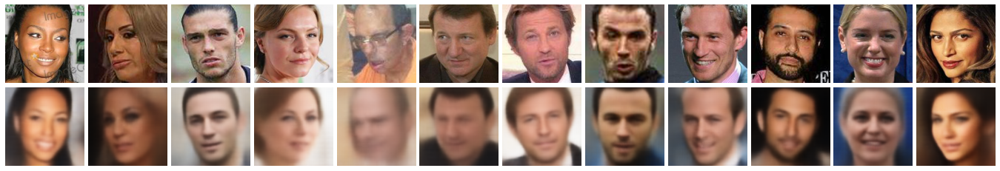

In [9]:
nidentities = 12

idxs = np.array([np.random.choice(np.where(y==cls)[0], size=1)[0] for cls in y_class[:nidentities]])

try: origin_sharpness = np.min(network.blurr_model.predict_on_batch(x[idxs]))
except: origin_sharpness = np.min(network.blurr_model.predict_on_batch(x[0][idxs]))
recon_sharpness = np.min(network.blurr_model.predict_on_batch(recon_x[idxs]))

fs = 2
nrows = 2
ncols = idxs.shape[0]
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 
for i in range(ncols):
    axes[0][i].imshow(real_img[idxs][i,:,:]* 0.5 + 0.5)
    axes[0][i].axis('off')
    axes[1][i].imshow(recon_x[idxs][i,:,:]* 0.5 + 0.5)
    axes[1][i].axis('off')
    
fig.subplots_adjust(wspace=0.025, hspace=0.05)
fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'test_reconstruction'), bbox_inches='tight')
fig.show()
log.info('origin_sharpness : %s', origin_sharpness)
log.info('recon_sharpness : %s', recon_sharpness)

### Prototype images

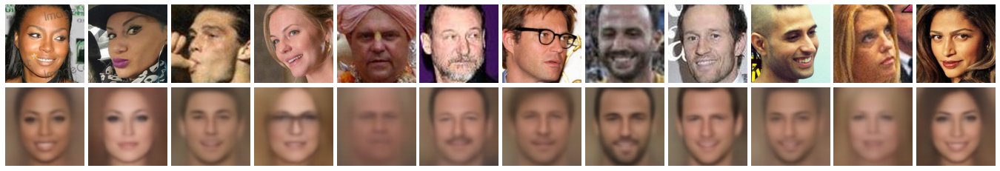

In [10]:
if ('oae' in network_info['model_info']['network_class'].lower() or \
    'conditional' in network_info['model_info']['network_class'].lower()):
    nidentities = 12
    picked_cls = y_class[:nidentities]
    x_idxs = np.array([picked_one_shot_idxs_per_class[np.where(y_class == cls)[0][0]] for cls in picked_cls])
    idxs = np.array([np.where(gen_y_class==cls)[0][0] for cls in picked_cls])

    fs = 2
    nrows = 2
    ncols = idxs.shape[0]
    fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 
    for i in range(ncols):
        axes[0][i].imshow(real_img[x_idxs][i,:,:]* 0.5 + 0.5)
        axes[0][i].axis('off')
        axes[1][i].imshow(prototype_images[idxs][i,:,:]* 0.5 + 0.5)
        axes[1][i].axis('off')
    fig.subplots_adjust(wspace=0.025, hspace=0.05)
    fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'test_prototype'), bbox_inches='tight')
    fig.show()

### One-shot prototype images

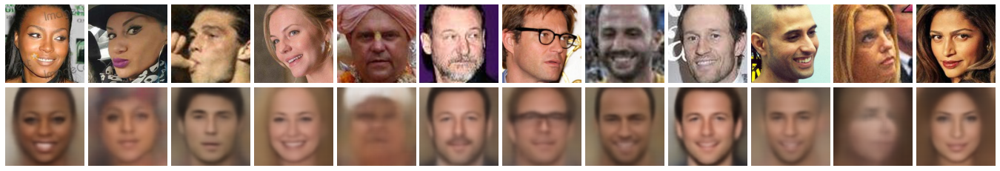

In [11]:
if 'oae' in network_info['model_info']['network_class'].lower():
    nidentities = 12
    picked_cls = y_class[:nidentities]

    x_idxs = np.array([picked_one_shot_idxs_per_class[np.where(y_class == cls)[0][0]] for cls in picked_cls])
    idxs = np.array([np.where(gen_y_class==cls)[0][0] for cls in picked_cls])
    
    fs = 2
    nrows = 2
    ncols = idxs.shape[0]
    fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 
    for i in range(ncols):
        axes[0][i].imshow(real_img[x_idxs][i,:,:]* 0.5 + 0.5)
        axes[0][i].axis('off')
        axes[1][i].imshow(one_shot_prototype_images[idxs][i,:,:]* 0.5 + 0.5)
        axes[1][i].axis('off')
    fig.subplots_adjust(wspace=0.025, hspace=0.05)
    fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'test_one_shot_prototype'), bbox_inches='tight')
    fig.show()

### Exemplar generation

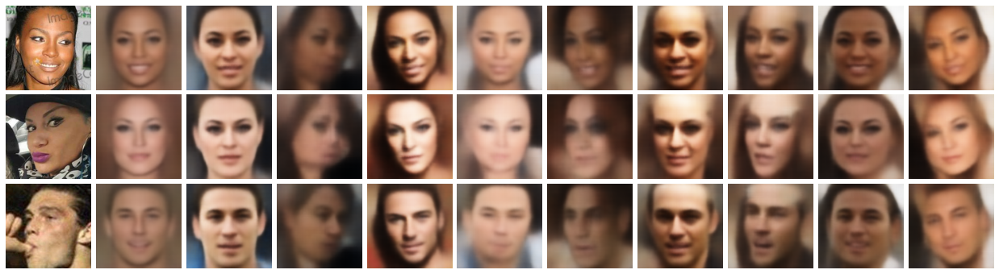

In [12]:
nidentities = 3
nrepeat = 10
fs = 2
nrows = nidentities
ncols = nrepeat + 1
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 

picked_cls = y_class[:nidentities]
x_idxs = np.array([picked_one_shot_idxs_per_class[np.where(y_class == cls)[0][0]] for cls in picked_cls])

for i in range(nrows):
    axes[i][0].imshow(real_img[x_idxs[i],:,:]* 0.5 + 0.5)
    axes[i][0].axis('off')
    for j in range(1, ncols):
        generated_img_idxs = np.where(gen_y_class==picked_cls[i])[0]
        axes[i][j].imshow(tiled_generated_images[generated_img_idxs[j-1],:,:]* 0.5 + 0.5)
        axes[i][j].axis('off')
fig.subplots_adjust(wspace=0.025, hspace=0.05)
fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'generate_images'), bbox_inches='tight')
fig.show()

### One-shot exemplar generation

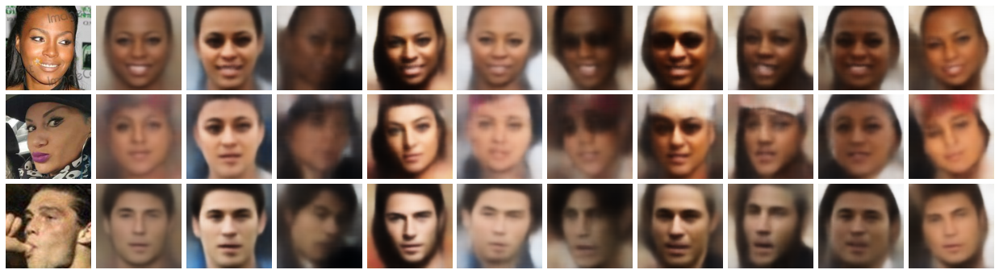

In [13]:
if 'oae' in network_info['model_info']['network_class'].lower():
    nidentities = 3
    nrepeat = 10
    fs = 2
    nrows = nidentities
    ncols = nrepeat + 1
    fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 

    picked_cls = y_class[:nidentities]
    x_idxs = np.array([picked_one_shot_idxs_per_class[np.where(y_class == cls)[0][0]] for cls in picked_cls])

    for i in range(nrows):
        axes[i][0].imshow(real_img[x_idxs[i],:,:]* 0.5 + 0.5)
        axes[i][0].axis('off')
        for j in range(1, ncols):
            generated_img_idxs = np.where(gen_y_class==picked_cls[i])[0]
            axes[i][j].imshow(tiled_one_shot_generated_images[generated_img_idxs[j-1],:,:]* 0.5 + 0.5)
            axes[i][j].axis('off')
    fig.subplots_adjust(wspace=0.025, hspace=0.05)
    fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'one_shot_exemplar_generation'), bbox_inches='tight')
    fig.show()

### Style transfer

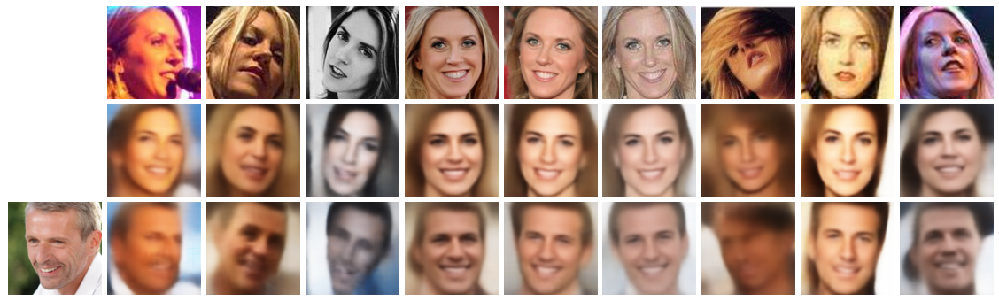

In [14]:
if ('oae' in network_info['model_info']['network_class'].lower()):
    ntype = 9
    picked_identity, base_identity = y_class[-2:]
    
    if 'randomintercept' in network_info['model_info']['network_class'].lower():
        recon_inputs = np.repeat(one_shot_b[y_class==base_identity], ntype, axis=0) + fake_noise[y==base_identity][:ntype]
        gen_inputs = np.repeat(one_shot_b[y_class==picked_identity], ntype, axis=0) + fake_noise[y==base_identity][:ntype]
    elif 'productspace' in network_info['model_info']['network_class'].lower():
        recon_inputs = np.concatenate([np.repeat(one_shot_b[y_class==base_identity], ntype, axis=0), fake_noise[y==base_identity][:ntype]],
                                      axis=-1)
        gen_inputs = np.concatenate([np.repeat(one_shot_b[y_class==picked_identity], ntype, axis=0), fake_noise[y==base_identity][:ntype]],
                                    axis=-1)
    else:
        recon_inputs = [fake_noise[y==base_identity][:ntype], np.repeat(wx[1][y==base_identity][:1], ntype, axis=0)]
        gen_inputs = [fake_noise[y==base_identity][:ntype], np.repeat(wx[1][y==picked_identity][:1], ntype, axis=0)]
    vector_arithmetic_recon = network.decoder_model.predict(recon_inputs, batch_size=100)
    vector_arithmetic_gen = network.decoder_model.predict(gen_inputs, batch_size=100)
        
    fs = 2
    nrows = 3
    ncols = ntype+1
    fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 

    axes[0][0].axis('off')
    axes[1][0].axis('off')
    axes[2][0].imshow(real_img[picked_one_shot_idxs_per_class[np.where(y_class == picked_identity)[0][0]],:,:]* 0.5 + 0.5)
    axes[2][0].axis('off')
    for j in range(1,ncols):
        axes[0][j].imshow(real_img[y==base_identity][j-1,:,:]* 0.5 + 0.5)
        axes[0][j].axis('off')
        axes[1][j].imshow(vector_arithmetic_recon[j-1,:,:]* 0.5 + 0.5)
        axes[1][j].axis('off')
        axes[2][j].imshow(vector_arithmetic_gen[j-1,:,:]* 0.5 + 0.5)
        axes[2][j].axis('off')
    fig.subplots_adjust(wspace=0.025, hspace=0.05)
    fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'style_transfer'), bbox_inches='tight')
    fig.show()

### One-shot style transfer and one-shot exemplar

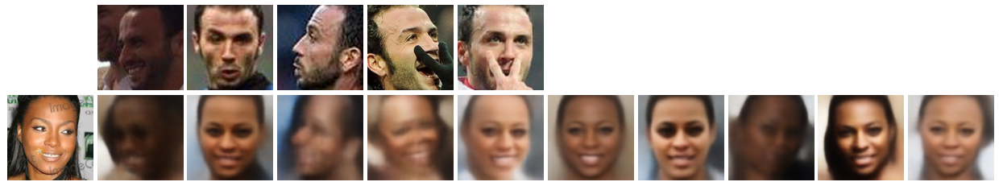

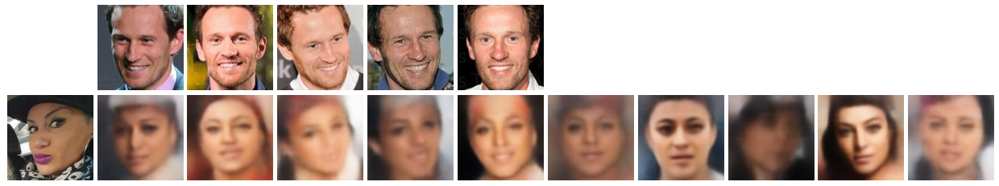

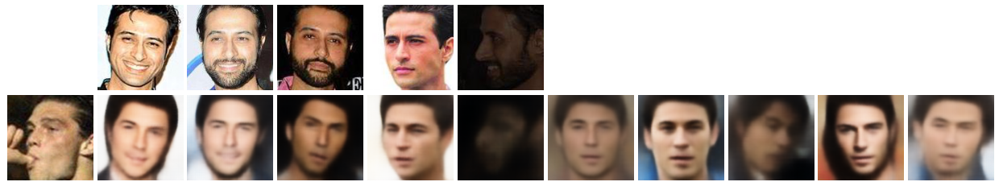

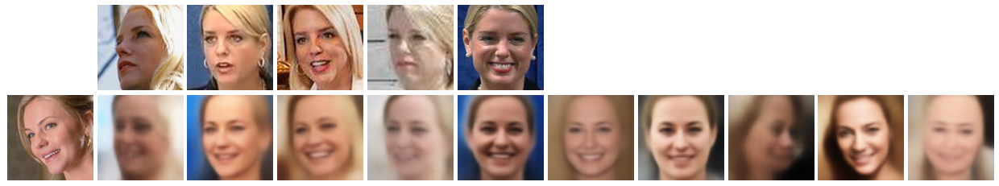

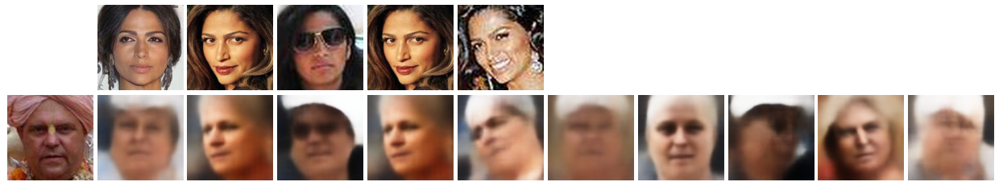

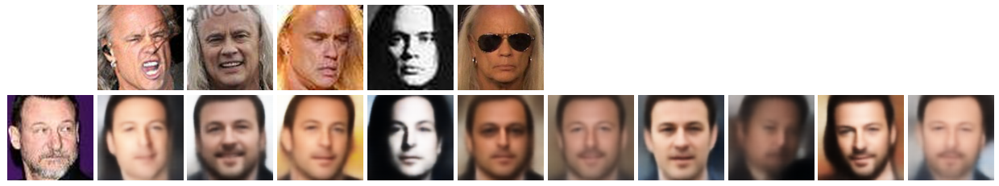

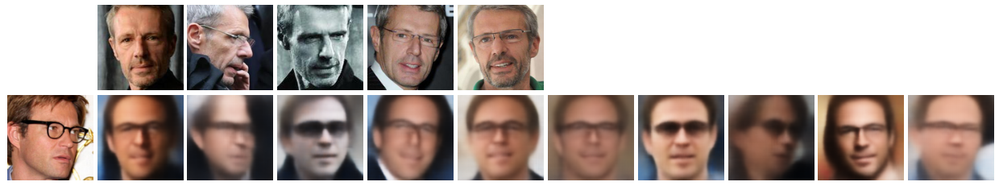

In [15]:
if 'oae' in network_info['model_info']['network_class'].lower():
    nidentities = 1
    # nidentities = y_class.shape[0]
    nrepeat = 5
    ntype = 5
    fs = 2
    nrows = nidentities+1
    ncols = nrepeat + ntype + 1
    
    for i in range(7):
#         i = 0
        picked_identity = y_class[i]
        base_identity = y_class[i+7]
        x_idxs = np.array([picked_one_shot_idxs_per_class[np.where(y_class == cls)[0][0]] for cls in picked_cls])

        if 'randomintercept' in network_info['model_info']['network_class'].lower():
            recon_inputs = np.repeat(one_shot_b[y_class==base_identity], ntype, axis=0) + fake_noise[y==base_identity][:ntype]
            gen_inputs = np.repeat(one_shot_b[y_class==picked_identity], ntype, axis=0) + fake_noise[y==base_identity][:ntype]
        elif 'productspace' in network_info['model_info']['network_class'].lower():
            recon_inputs = np.concatenate([np.repeat(one_shot_b[y_class==base_identity], ntype, axis=0), fake_noise[y==base_identity][:ntype]],
                                          axis=-1)
            gen_inputs = np.concatenate([np.repeat(one_shot_b[y_class==picked_identity], ntype, axis=0), fake_noise[y==base_identity][:ntype]],
                                        axis=-1)
        else:
            recon_inputs = [fake_noise[y==base_identity][:ntype], np.repeat(wx[1][y==base_identity][:1], ntype, axis=0)]
            gen_inputs = [fake_noise[y==base_identity][:ntype], np.repeat(wx[1][y==picked_identity][:1], ntype, axis=0)]
        vector_arithmetic_recon = network.decoder_model.predict(recon_inputs, batch_size=100)
        vector_arithmetic_gen = network.decoder_model.predict(gen_inputs, batch_size=100)

        fig, axes = plt.subplots(nrows = 2, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 
        axes[0][0].axis('off')
    #     axes[1][0].axis('off')
        axes[1][0].imshow(real_img[picked_one_shot_idxs_per_class[np.where(y_class == picked_identity)[0][0]],:,:]* 0.5 + 0.5)
        axes[1][0].axis('off')
        for j in range(1,ntype+1):
            axes[0][j].imshow(real_img[y==base_identity][j-1,:,:]* 0.5 + 0.5)
            axes[0][j].axis('off')
    #         axes[1][j].imshow(vector_arithmetic_recon[j-1,:,:]* 0.5 + 0.5)
    #         axes[1][j].axis('off')
            axes[1][j].imshow(vector_arithmetic_gen[j-1,:,:]* 0.5 + 0.5)
            axes[1][j].axis('off')
        for j in range(1,nrepeat+1):
            generated_img_idxs = np.where(gen_y_class==picked_identity)[0]
            axes[0][ntype+j].imshow(np.ones_like(real_img[0,:,:]))
            axes[0][ntype+j].axis('off')
            axes[1][ntype+j].imshow(tiled_one_shot_generated_images[generated_img_idxs[j-1],:,:]* 0.5 + 0.5)
            axes[1][ntype+j].axis('off')
        fig.subplots_adjust(wspace=0.025, hspace=0.05)
        fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'one_shot_together_identity_%d'%i), bbox_inches='tight')
        fig.show()

## Latent space analysis

#### Within-unit variation encoder

In [16]:
picked = np.sum([y==cls for cls in y_class[:15]], axis=0).astype(np.bool)
latent = np.vstack([true_noise[picked], fake_noise[picked]])
latent_class = np.concatenate([np.ones(true_noise[picked].shape[0]), np.zeros(true_noise[picked].shape[0])])
latent_picked_class = np.unique(y[picked])
latent_class_y = np.concatenate([100000*np.ones(true_noise[picked].shape[0]), y[picked]])    
tsne = TSNE(n_components=2, random_state=0)
latent_tsne = tsne.fit_transform(latent)

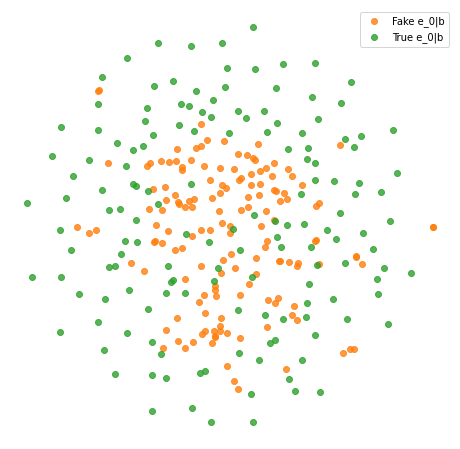

In [17]:
plt.figure(figsize=(8, 8))
plt.scatter(x = latent_tsne[latent_class==0,0], y=latent_tsne[latent_class==0,1], c='C1', label='Fake e_0|b', alpha=0.8)
plt.scatter(x = latent_tsne[latent_class==1,0], y=latent_tsne[latent_class==1,1], c='C2', label='True e_0|b', alpha=0.8)
plt.legend()
plt.axis('off')
plt.savefig("%s/%s_within_unit_variation_tsne" % (fig_dir, model_aka), bbox_inches='tight')
plt.show()

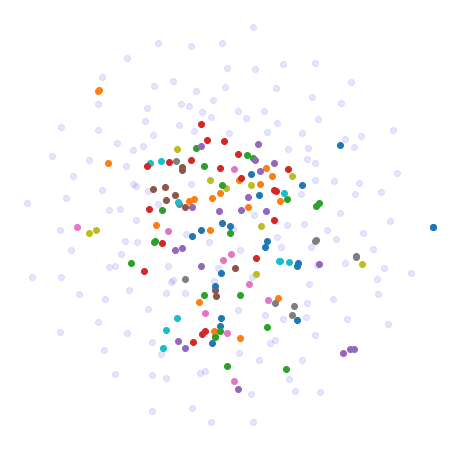

In [18]:
plt.figure(figsize=(8, 8))
plt.scatter(x = latent_tsne[latent_class_y==100000,0], y=latent_tsne[latent_class_y==100000,1], label='True e', alpha=0.1, c='blue')
for cls in np.unique(latent_class_y)[:-1]:
    plt.scatter(x = latent_tsne[latent_class_y==cls,0], y=latent_tsne[latent_class_y==cls,1], label='Fake e^%s'%cls, alpha=1., cmap='Set3')
plt.axis('off')
plt.savefig("%s/%s_within_unit_variation_tsne_class" % (fig_dir, model_aka), bbox_inches='tight')
plt.show()

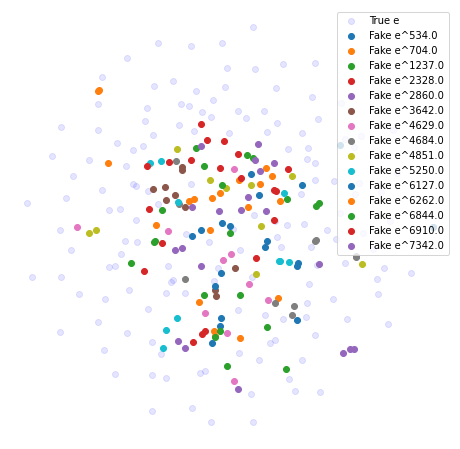

In [19]:
plt.figure(figsize=(8, 8))
plt.scatter(x = latent_tsne[latent_class_y==100000,0], y=latent_tsne[latent_class_y==100000,1], label='True e', alpha=0.1, c='blue')
for cls in np.unique(latent_class_y)[:-1]:
    plt.scatter(x = latent_tsne[latent_class_y==cls,0], y=latent_tsne[latent_class_y==cls,1], label='Fake e^%s'%cls, alpha=1., cmap='Set3')
plt.legend()
plt.axis('off')
plt.savefig("%s/%s_within_unit_variation_tsne_class_with_legend" % (fig_dir, model_aka), bbox_inches='tight')
plt.show()

#### Identity encoder

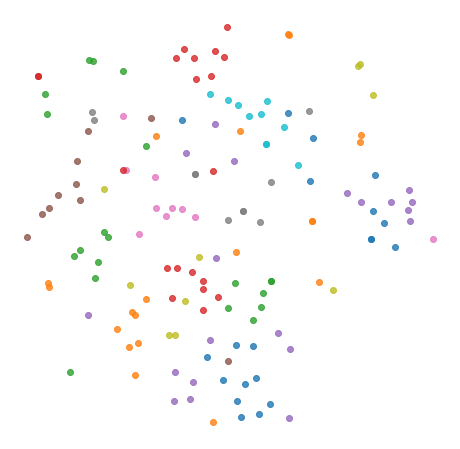

In [20]:
if 'oae' in network_info['model_info']['network_class'].lower():
    picked = np.sum([y==cls for cls in y_class[:15]], axis=0).astype(np.bool)
    picked_y = y[picked]
    picked_estimate_b = estimate_b[picked]
    tsne = TSNE(n_components=2, random_state=0)
    fake_b_tsne = tsne.fit_transform(picked_estimate_b)
    
    plt.figure(figsize=(8, 8))
    for cls in np.unique(picked_y):
        plt.scatter(x=fake_b_tsne[picked_y==cls,0], y=fake_b_tsne[picked_y==cls,1], label=cls, alpha=0.8, cmap=pylab.cm.cool)
    plt.axis('off')
    plt.savefig("%s/%s_identity_tsne" % (fig_dir, model_aka), bbox_inches='tight')
    plt.show()

#### Fake latent

In [21]:
if 'oae' in network_info['model_info']['network_class'].lower():
    fake_latent = np.concatenate([sample_b, fake_noise], axis=-1)
    
picked = np.sum([y==cls for cls in y_class], axis=0).astype(np.bool)
picked_y = y[picked]
picked_fake_noise = fake_latent[picked]
tsne = TSNE(n_components=2, random_state=0)
fake_noise = tsne.fit_transform(picked_fake_noise)

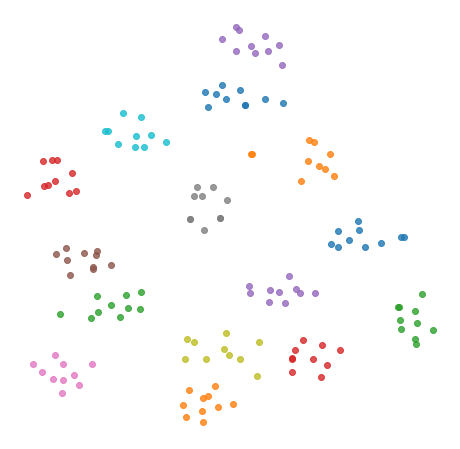

In [22]:
plt.figure(figsize=(8, 8))
for cls in np.unique(picked_y):
    plt.scatter(x=fake_noise[picked_y==cls,0], y=fake_noise[picked_y==cls,1], label=cls, alpha=0.8, cmap=pylab.cm.cool)
plt.axis('off')
plt.savefig("%s/%s_fake_latent_tsne" % (fig_dir, model_aka), bbox_inches='tight')
plt.show()

# Result (identities not used in training)

In [23]:
if 'oae' in network_info['model_info']['network_class'].lower():
    seed_value = 1234
    os.environ['PYTHONHASHSEED']=str(seed_value)
    random.seed(seed_value)
    np.random.seed(seed_value)
    tf.set_random_seed(seed_value)

    # Real Test data sampler (not-trained subject)
    new_network_info = copy.deepcopy(network_info)
    new_path_info = copy.deepcopy(path_info)
    new_reader = reader_class(log, new_path_info, new_network_info, mode='test', verbose=True)
    real_test_idx = np.arange(new_reader.get_label().shape[0])

    log.info('Construct real test data sampler')
    real_test_sampler = validation_sampler_class(log, real_test_idx, new_reader, network_info['validation_info'], verbose=True)
    real_test_generator = samplers.train_generator(real_test_sampler)
    log.info('%s, %s' % (np.intersect1d(test_sampler.y_class, real_test_sampler.y_class),
                         np.union1d(test_sampler.y_class, real_test_sampler.y_class).shape[0]))

[root    |INFO|readers.py:525] -------------------------------------------------
[root    |INFO|readers.py:526] Construct Dataset
[root    |INFO|readers.py:527] -------------------------------------------------
[root    |INFO|readers.py:528] Loading VGG Face 2 dataset information
[root    |INFO|readers.py:530] Set image shape : [128 128   3]
[root    |INFO|readers.py:74] -------------------------------------------------
[root    |INFO|readers.py:75] Images per Class
[root    |INFO|readers.py:76] 
n004563    761
n001242    644
n003217    641
n001878    638
n008361    617
          ... 
n005668    123
n004068    120
n009175    113
n001850     99
n006987     98
Length: 500, dtype: int64
[root    |INFO|readers.py:77] -------------------------------------------------
[root    |INFO|readers.py:78] Summary
[root    |INFO|readers.py:79] 
count    500.000000
mean     338.792000
std      115.264394
min       98.000000
25%      248.000000
50%      325.000000
75%      424.000000
max      761.00000

In [24]:
if 'oae' in network_info['model_info']['network_class'].lower():
    nunit = 15
    nobservations = 10
    unknown_picked_y_class = np.random.choice(real_test_sampler.y_class, nunit, replace=False)
    real_test_idxs = []
    real_picked_one_shot_idxs = []
    for yc in unknown_picked_y_class:
        chosen_observations = np.random.choice(real_test_sampler.train_idx[real_test_sampler.y_index.get_loc(yc)], nobservations)
        real_test_idxs.append(chosen_observations) # 10 observatoins for unit
        real_picked_one_shot_idxs.append(np.random.choice(np.arange(nobservations), 1)[0])
    real_test_idxs = np.array(real_test_idxs).flatten()
    real_picked_one_shot_idxs = np.array(real_picked_one_shot_idxs)
    
    nunit = 15
    nobservations = 10
    unknown_picked_y_class = np.random.choice(real_test_sampler.y_class, nunit, replace=False)
    real_test_idxs = []
    real_picked_one_shot_idxs = []
    for yc in unknown_picked_y_class:
        chosen_observations = np.random.choice(real_test_sampler.train_idx[real_test_sampler.y_index.get_loc(yc)], nobservations)
        real_test_idxs.append(chosen_observations) # 10 observatoins for unit
        real_picked_one_shot_idxs.append(np.random.choice(np.arange(nobservations), 1)[0])
    real_test_idxs = np.array(real_test_idxs).flatten()
    real_picked_one_shot_idxs = np.array(real_picked_one_shot_idxs)
    
    x, y = real_test_sampler.reader.get_batch(real_test_idxs)
    
    y_table = pd.Series(y)
    y_index = pd.Index(y)
    y_class = y_table.unique()
    y_table = pd.Series(y)
    y_counts = y_table.value_counts()
    log.info('-------------------------------------------------')
    log.info('Images per Class')
    log.info('\n%s', y_counts)
    log.info('-------------------------------------------------')
    log.info('Summary')
    log.info('\n%s', y_counts.describe())
    log.info('-------------------------------------------------')

    wx, wy = network.main_sampler(x,y)

[root    |INFO|<ipython-input-24-0f644091ad86>:33] -------------------------------------------------
[root    |INFO|<ipython-input-24-0f644091ad86>:34] Images per Class
[root    |INFO|<ipython-input-24-0f644091ad86>:35] 
246    10
183    10
167    10
422    10
165    10
400    10
377    10
373    10
371    10
347    10
331    10
57     10
18     10
14     10
2      10
dtype: int64
[root    |INFO|<ipython-input-24-0f644091ad86>:36] -------------------------------------------------
[root    |INFO|<ipython-input-24-0f644091ad86>:37] Summary
[root    |INFO|<ipython-input-24-0f644091ad86>:38] 
count    15.0
mean     10.0
std       0.0
min      10.0
25%      10.0
50%      10.0
75%      10.0
max      10.0
dtype: float64
[root    |INFO|<ipython-input-24-0f644091ad86>:39] -------------------------------------------------


In [25]:
if 'oae' in network_info['model_info']['network_class'].lower():
    recon_x = network.ae_model.predict(wx[:-1], batch_size=100)
    try:
        if len(x.shape) == 4: real_img = x
    except: real_img = x[0]

    repeated = 10
    esp = 1.
    gen_y_class = np.repeat(y_class, repeated, axis=0)
    
    real_picked_one_shot_idxs_per_class = np.array([np.where(y==cls)[0][real_picked_one_shot_idxs[i]] for i, cls in enumerate(y_class)])
    
    if 'randomintercept' in network_info['model_info']['network_class'].lower():
        b_sd = float(network_info['model_info']['b_sd'])
        estimate_b, fake_noise = network.encoder_model.predict(x, batch_size=100)
        new_b = np.random.multivariate_normal(np.zeros(network.get_z_dim()), 
                                              b_sd**2.*np.identity(network.get_z_dim()), 
                                              y_class.shape[0]).astype(np.float32)
        b = np.array([np.mean(estimate_b[np.random.choice(np.where(y==cls)[0],5)], axis=0) for cls in y_class])
        one_shot_b = np.array([estimate_b[real_picked_one_shot_idxs_per_class[i]] for i, cls in enumerate(y_class)])
        fake_latent = estimate_b + fake_noise
    elif 'productspace' in network_info['model_info']['network_class'].lower():
        if feature_b: img, feature, clss, b_noise = wx
        else: img, clss, b_noise = wx
        b_sd = float(network_info['model_info']['b_sd'])

        if feature_b:
            sample_b, b_given_x, estimate_b  = network.encoder_b_model.predict_on_batch([feature, clss])
        else:
            sample_b, b_given_x, estimate_b  = network.encoder_b_model.predict_on_batch([img, clss])

        b = np.array([np.mean(estimate_b[np.random.choice(np.where(y==cls)[0],5)], axis=0) for cls in y_class])
        fake_noise = network.encoder_e_model.predict(wx[:-1], batch_size=100)
        new_b = np.random.multivariate_normal(np.zeros(b.shape[-1]), 
                                              b_sd**2.*np.identity(b.shape[-1]), 
                                              y_class.shape[0]).astype(np.float32)
        one_shot_b = np.array([estimate_b[real_picked_one_shot_idxs_per_class[i]] for i, cls in enumerate(y_class)])
    else:
        fake_latent = network.encoder_model.predict(x, batch_size=100)
        fake_noise = fake_latent

    mean = np.zeros(fake_noise.shape[-1])
    cov = float(network_info['model_info']['e_sd'])**2.*np.identity(fake_noise.shape[-1])
    true_noise = np.random.multivariate_normal(mean,cov,y.shape[0]).astype(np.float32)
    mean = np.zeros(fake_noise.shape[-1])
    cov = esp*np.identity(fake_noise.shape[-1])
    noise = np.random.multivariate_normal(mean,cov,y_class.shape[0]*repeated).astype(np.float32)

    tiled_noise = np.random.multivariate_normal(mean,cov,repeated).astype(np.float32)
    tiled_noise[0,:] = 0.
    tiled_noise = np.tile(tiled_noise, (y_class.shape[0],1))

    if 'randomintercept' in network_info['model_info']['network_class'].lower():
        generated_images = network.decoder_model.predict(noise + np.repeat(b, repeated, axis=0),  batch_size=100)
        tiled_generated_images = network.decoder_model.predict(tiled_noise + np.repeat(b, repeated, axis=0), batch_size=100)
        prototype_images = network.decoder_model.predict(np.repeat(b, repeated, axis=0), batch_size=100)
        one_shot_prototype_images = network.decoder_model.predict(np.repeat(one_shot_b, repeated, axis=0), batch_size=100)
        one_shot_generated_images = network.decoder_model.predict(noise + np.repeat(one_shot_b, repeated, axis=0), batch_size=100)
        tiled_one_shot_generated_images = network.decoder_model.predict(tiled_noise + np.repeat(one_shot_b, repeated, axis=0),
                                                                        batch_size=100)
        tiled_new_generated_images = network.decoder_model.predict(tiled_noise + np.repeat(new_b, repeated, axis=0), batch_size=100)
    elif 'productspace' in network_info['model_info']['network_class'].lower():
        generated_images = network.decoder_model.predict(np.concatenate([np.repeat(b, repeated, axis=0), noise], axis=-1),
                                                         batch_size=100)
        tiled_generated_images = network.decoder_model.predict(np.concatenate([np.repeat(b, repeated, axis=0), tiled_noise], axis=-1),
                                                               batch_size=100)
        prototype_images = network.decoder_model.predict(np.concatenate([np.repeat(b, repeated, axis=0), np.zeros_like(noise)], axis=-1),
                                                         batch_size=100)
        one_shot_prototype_images = network.decoder_model.predict(np.concatenate([np.repeat(one_shot_b, repeated, axis=0), np.zeros_like(noise)], axis=-1),
                                                         batch_size=100)
        one_shot_generated_images = network.decoder_model.predict(np.concatenate([np.repeat(one_shot_b, repeated, axis=0), noise], axis=-1),
                                                                  batch_size=100)
        tiled_one_shot_generated_images = network.decoder_model.predict(np.concatenate([np.repeat(one_shot_b, repeated, axis=0), tiled_noise], axis=-1),
                                                                        batch_size=100)
        tiled_new_generated_images = network.decoder_model.predict(np.concatenate([np.repeat(new_b, repeated, axis=0), tiled_noise], axis=-1),
                                                                   batch_size=100)
    elif 'conditional' in network_info['model_info']['network_class'].lower():
        generated_images = network.decoder_model.predict([noise, to_categorical(gen_y_class, reader.get_n_label())], batch_size=100)
        tiled_generated_images = network.decoder_model.predict([tiled_noise, to_categorical(gen_y_class, reader.get_n_label())],
                                                               batch_size=100)
        prototype_images = network.decoder_model.predict([np.zeros_like(noise), to_categorical(gen_y_class, reader.get_n_label())], batch_size=100)
    else:
        generated_images = network.decoder_model.predict(noise, batch_size=100)
        tiled_generated_images = network.decoder_model.predict(tiled_noise, batch_size=100)

### Reconstruction of the Test Data

[root    |INFO|<ipython-input-26-dfcfcd510417>:24] origin_sharpness : 0.008198323
[root    |INFO|<ipython-input-26-dfcfcd510417>:25] recon_sharpness : 0.0021628998


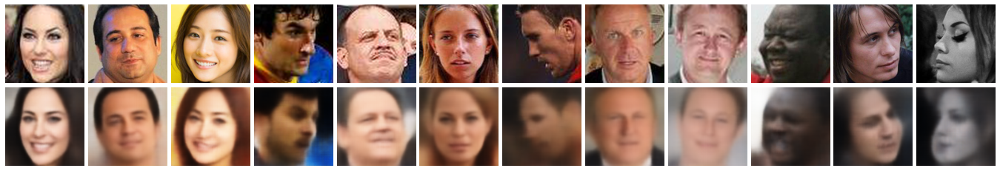

In [26]:
if 'oae' in network_info['model_info']['network_class'].lower():
    nidentities = 12
    idxs = np.array([np.random.choice(np.where(y==cls)[0], size=1)[0] for cls in y_class[:nidentities]])

    try: origin_sharpness = np.min(network.blurr_model.predict_on_batch(x[idxs]))
    except: origin_sharpness = np.min(network.blurr_model.predict_on_batch(x[0][idxs]))
    recon_sharpness = np.min(network.blurr_model.predict_on_batch(recon_x[idxs]))

    fs = 2
    nrows = 2
    ncols = idxs.shape[0]
    fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 
    for i in range(ncols):
        try: axes[0][i].imshow(real_img[idxs][i,:,:]* 0.5 + 0.5)
        except: axes[0][i].imshow(real_img[0][idxs][i,:,:]* 0.5 + 0.5)
        axes[0][i].axis('off')
        axes[1][i].imshow(recon_x[idxs][i,:,:]* 0.5 + 0.5)
        axes[1][i].axis('off')

    fig.subplots_adjust(wspace=0.025, hspace=0.05)
    fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'unknown_test_reconstruction'), bbox_inches='tight')
    fig.show()

    log.info('origin_sharpness : %s', origin_sharpness)
    log.info('recon_sharpness : %s', recon_sharpness)

### Prototype images

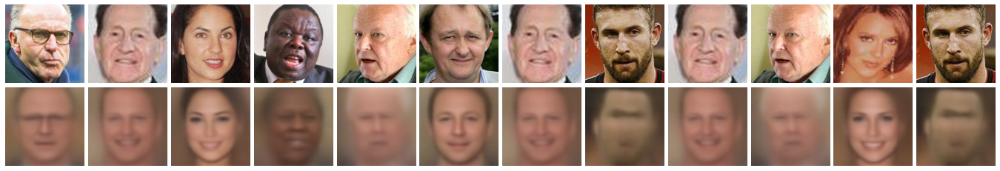

In [27]:
if 'wae' not in network_info['model_info']['network_class'].lower():
    nidentities = 12
    picked_cls = np.random.choice(y_class, nidentities)
    x_idxs = np.array([real_picked_one_shot_idxs_per_class[np.where(y_class == cls)[0][0]] for cls in picked_cls])
    idxs = np.array([np.where(gen_y_class==cls)[0][0] for cls in picked_cls])

    fs = 2
    nrows = 2
    ncols = idxs.shape[0]
    fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 
    for i in range(ncols):
        axes[0][i].imshow(real_img[x_idxs][i,:,:]* 0.5 + 0.5)
        axes[0][i].axis('off')
        axes[1][i].imshow(prototype_images[idxs][i,:,:]* 0.5 + 0.5)
        axes[1][i].axis('off')

    fig.subplots_adjust(wspace=0.025, hspace=0.05)
    fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'unknown_test_prototype'), bbox_inches='tight')
    fig.show()

### One-shot prototype images

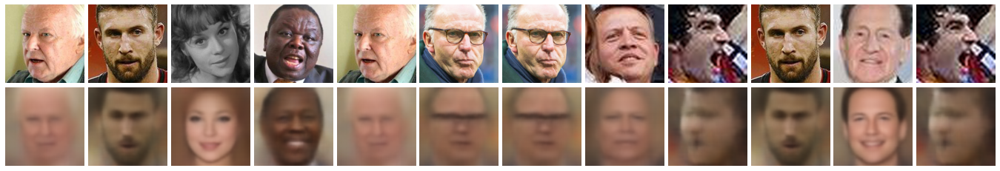

In [28]:
if 'wae' not in network_info['model_info']['network_class'].lower():
    nidentities = 12
    picked_cls = np.random.choice(y_class, nidentities)
    x_idxs = np.array([real_picked_one_shot_idxs_per_class[np.where(y_class == cls)[0][0]] for cls in picked_cls])
    idxs = np.array([np.where(gen_y_class==cls)[0][0] for cls in picked_cls])
    
    fs = 2
    nrows = 2
    ncols = idxs.shape[0]
    fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 
    for i in range(ncols):
        axes[0][i].imshow(real_img[x_idxs][i,:,:]* 0.5 + 0.5)
        axes[0][i].axis('off')
        axes[1][i].imshow(one_shot_prototype_images[idxs][i,:,:]* 0.5 + 0.5)
        axes[1][i].axis('off')
        
    fig.subplots_adjust(wspace=0.025, hspace=0.05)
    fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'unknown_test_one_shot_prototype'), bbox_inches='tight')
    fig.show()

### Exemplar generation

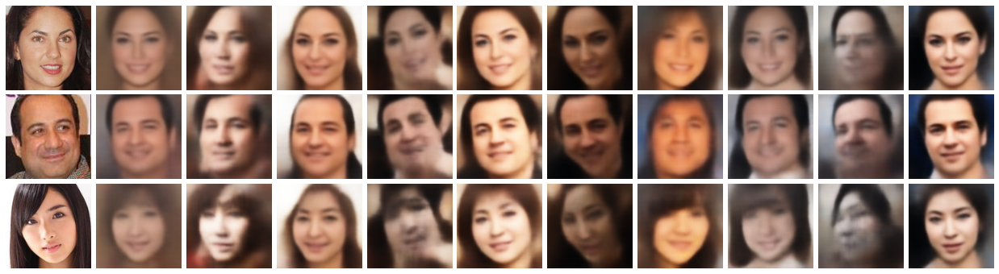

In [29]:
if 'oae' in network_info['model_info']['network_class'].lower():
    nidentities = 3
    nrepeat = 10
    fs = 2
    nrows = nidentities
    ncols = nrepeat + 1
    fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 

    picked_cls = y_class[np.array([0,1,2,7])]
    x_idxs = np.array([real_picked_one_shot_idxs_per_class[np.where(y_class == cls)[0][0]] for cls in picked_cls])

    for i in range(nrows):
        axes[i][0].imshow(real_img[x_idxs[i],:,:]* 0.5 + 0.5)
        axes[i][0].axis('off')
        for j in range(1, ncols):
            generated_img_idxs = np.where(gen_y_class==picked_cls[i])[0]
            axes[i][j].imshow(tiled_generated_images[generated_img_idxs[j-1],:,:]* 0.5 + 0.5)
            axes[i][j].axis('off')

    fig.subplots_adjust(wspace=0.025, hspace=0.05)
    fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'unknown_exemplar_generation'), bbox_inches='tight')
    fig.show()

### One-shot exemplar generation

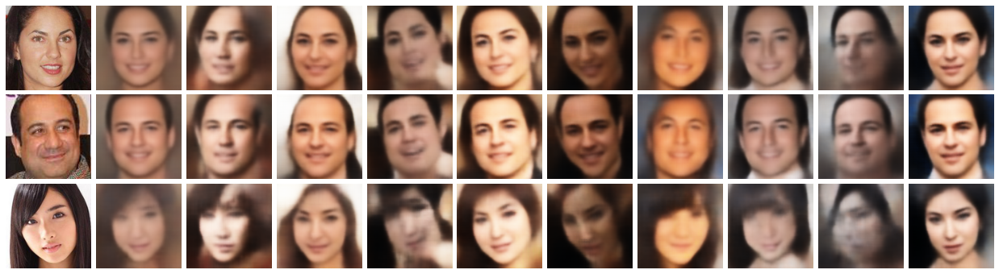

In [30]:
if 'oae' in network_info['model_info']['network_class'].lower():
    nidentities = 3
    nrepeat = 10
    fs = 2
    nrows = nidentities
    ncols = nrepeat + 1
    fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 

    picked_cls = y_class[:nidentities]
    picked_cls = y_class[np.array([0,1,2,7])]
    x_idxs = np.array([real_picked_one_shot_idxs_per_class[np.where(y_class == cls)[0][0]] for cls in picked_cls])

    for i in range(nrows):
        axes[i][0].imshow(real_img[x_idxs[i],:,:]* 0.5 + 0.5)
        axes[i][0].axis('off')
        for j in range(1, ncols):
            generated_img_idxs = np.where(gen_y_class==picked_cls[i])[0]
            axes[i][j].imshow(tiled_one_shot_generated_images[generated_img_idxs[j-1],:,:]* 0.5 + 0.5)
            axes[i][j].axis('off')

    fig.subplots_adjust(wspace=0.025, hspace=0.05)
    fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'unknown_one_shot_exemplar_generation'), bbox_inches='tight')
    fig.show()

### Style transfer

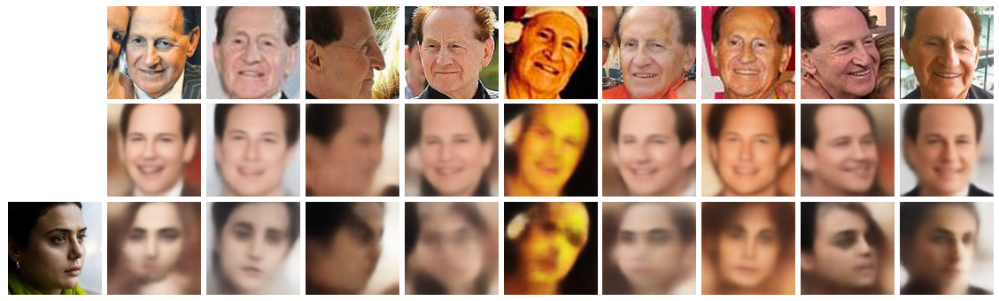

In [31]:
if ('oae' in network_info['model_info']['network_class'].lower()):
    ntype = 9
    picked_identity, base_identity = y_class[-2:]
    
    if 'randomintercept' in network_info['model_info']['network_class'].lower():
        recon_inputs = np.repeat(one_shot_b[y_class==base_identity], ntype, axis=0) + fake_noise[y==base_identity][:ntype]
        gen_inputs = np.repeat(one_shot_b[y_class==picked_identity], ntype, axis=0) + fake_noise[y==base_identity][:ntype]
    elif 'productspace' in network_info['model_info']['network_class'].lower():
        recon_inputs = np.concatenate([np.repeat(one_shot_b[y_class==base_identity], ntype, axis=0), fake_noise[y==base_identity][:ntype]],
                                      axis=-1)
        gen_inputs = np.concatenate([np.repeat(one_shot_b[y_class==picked_identity], ntype, axis=0), fake_noise[y==base_identity][:ntype]],
                                    axis=-1)
    else:
        recon_inputs = [fake_noise[y==base_identity][:ntype], np.repeat(wx[1][y==base_identity][:1], ntype, axis=0)]
        gen_inputs = [fake_noise[y==base_identity][:ntype], np.repeat(wx[1][y==picked_identity][:1], ntype, axis=0)]
    vector_arithmetic_recon = network.decoder_model.predict(recon_inputs, batch_size=100)
    vector_arithmetic_gen = network.decoder_model.predict(gen_inputs, batch_size=100)
        
    fs = 2
    nrows = 3
    ncols = ntype+1
    fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 

    axes[0][0].axis('off')
    axes[1][0].axis('off')
    axes[2][0].imshow(real_img[real_picked_one_shot_idxs_per_class[np.where(y_class == picked_identity)[0][0]],:,:]* 0.5 + 0.5)
    axes[2][0].axis('off')
    for j in range(1,ncols):
        axes[0][j].imshow(real_img[y==base_identity][j-1,:,:]* 0.5 + 0.5)
        axes[0][j].axis('off')
        axes[1][j].imshow(vector_arithmetic_recon[j-1,:,:]* 0.5 + 0.5)
        axes[1][j].axis('off')
        axes[2][j].imshow(vector_arithmetic_gen[j-1,:,:]* 0.5 + 0.5)
        axes[2][j].axis('off')
    fig.subplots_adjust(wspace=0.025, hspace=0.05)
    fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'unknown_style_transfer'), bbox_inches='tight')
    fig.show()

### One-shot style transfer and one-shot exemplar

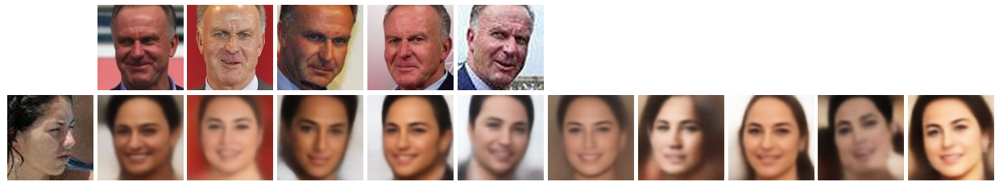

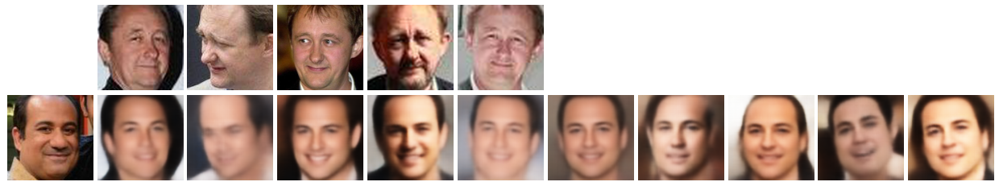

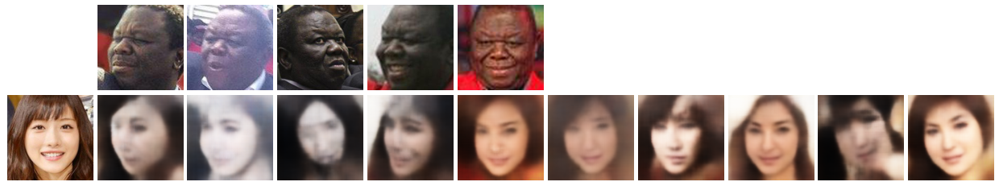

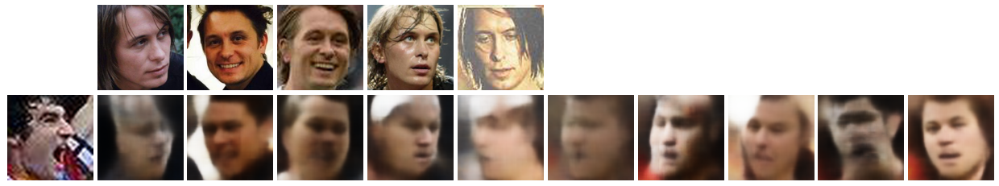

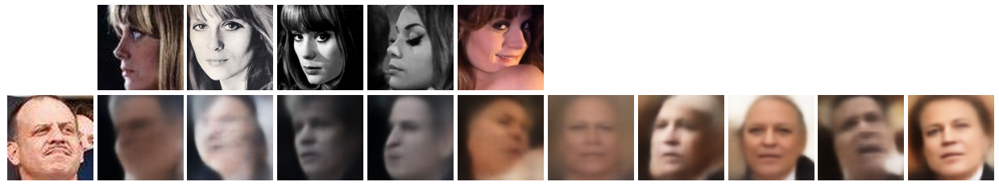

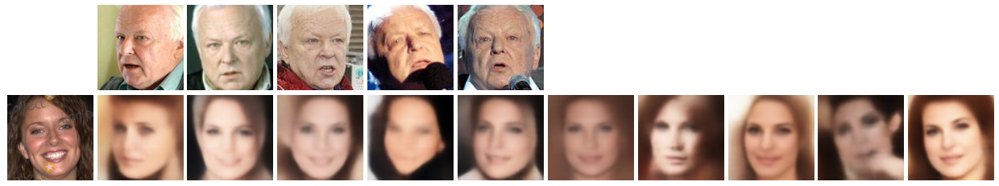

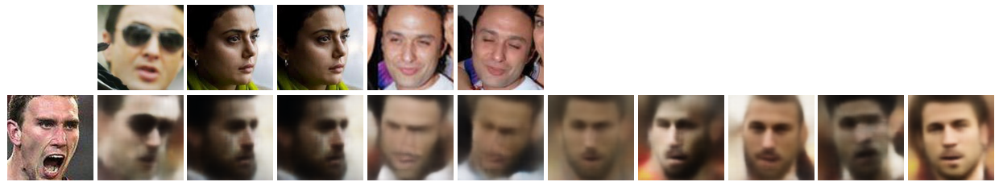

In [32]:
if 'oae' in network_info['model_info']['network_class'].lower():
    nidentities = 1
    # nidentities = y_class.shape[0]
    nrepeat = 5
    ntype = 5
    fs = 2
    nrows = nidentities+1
    ncols = nrepeat + ntype + 1
    
    for i in range(7):
#         i = 0
        picked_identity = y_class[i]
        base_identity = y_class[i+7]
        x_idxs = np.array([picked_one_shot_idxs_per_class[np.where(y_class == cls)[0][0]] for cls in picked_cls])

        if 'randomintercept' in network_info['model_info']['network_class'].lower():
            recon_inputs = np.repeat(one_shot_b[y_class==base_identity], ntype, axis=0) + fake_noise[y==base_identity][:ntype]
            gen_inputs = np.repeat(one_shot_b[y_class==picked_identity], ntype, axis=0) + fake_noise[y==base_identity][:ntype]
        elif 'productspace' in network_info['model_info']['network_class'].lower():
            recon_inputs = np.concatenate([np.repeat(one_shot_b[y_class==base_identity], ntype, axis=0), fake_noise[y==base_identity][:ntype]],
                                          axis=-1)
            gen_inputs = np.concatenate([np.repeat(one_shot_b[y_class==picked_identity], ntype, axis=0), fake_noise[y==base_identity][:ntype]],
                                        axis=-1)
        else:
            recon_inputs = [fake_noise[y==base_identity][:ntype], np.repeat(wx[1][y==base_identity][:1], ntype, axis=0)]
            gen_inputs = [fake_noise[y==base_identity][:ntype], np.repeat(wx[1][y==picked_identity][:1], ntype, axis=0)]
        vector_arithmetic_recon = network.decoder_model.predict(recon_inputs, batch_size=100)
        vector_arithmetic_gen = network.decoder_model.predict(gen_inputs, batch_size=100)

        fig, axes = plt.subplots(nrows = 2, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 
        axes[0][0].axis('off')
    #     axes[1][0].axis('off')
        axes[1][0].imshow(real_img[picked_one_shot_idxs_per_class[np.where(y_class == picked_identity)[0][0]],:,:]* 0.5 + 0.5)
        axes[1][0].axis('off')
        for j in range(1,ntype+1):
            axes[0][j].imshow(real_img[y==base_identity][j-1,:,:]* 0.5 + 0.5)
            axes[0][j].axis('off')
    #         axes[1][j].imshow(vector_arithmetic_recon[j-1,:,:]* 0.5 + 0.5)
    #         axes[1][j].axis('off')
            axes[1][j].imshow(vector_arithmetic_gen[j-1,:,:]* 0.5 + 0.5)
            axes[1][j].axis('off')
        for j in range(1,nrepeat+1):
            generated_img_idxs = np.where(gen_y_class==picked_identity)[0]
            axes[0][ntype+j].imshow(np.ones_like(real_img[0,:,:]))
            axes[0][ntype+j].axis('off')
            axes[1][ntype+j].imshow(tiled_one_shot_generated_images[generated_img_idxs[j-1],:,:]* 0.5 + 0.5)
            axes[1][ntype+j].axis('off')
        fig.subplots_adjust(wspace=0.025, hspace=0.05)
        fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'unknown_one_shot_together_identity_%d'%i), bbox_inches='tight')
        fig.show()

### Unit generation

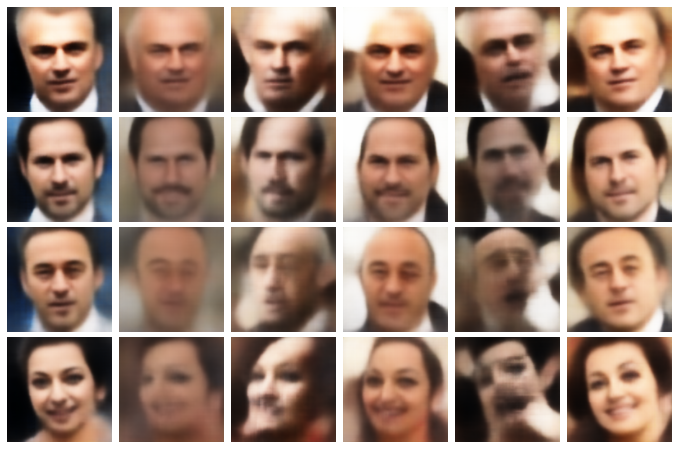

In [33]:
if 'oae' in network_info['model_info']['network_class'].lower():
    nidentities = 4
    nrepeat = 6
    fs = 2
    nrows = nidentities
    ncols = nrepeat
    fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 
    
    picked_new_class = np.random.choice(np.arange(new_b.shape[0]), nrows, replace=False)
    for i in range(nrows):
        for j in range(0, ncols):
            generated_img_idxs = np.arange(picked_new_class[i]*repeated, (picked_new_class[i]+1)*repeated)
            axes[i][j].imshow(tiled_new_generated_images[generated_img_idxs[j-1],:,:]* 0.5 + 0.5)
            axes[i][j].axis('off')
    fig.subplots_adjust(wspace=0.025, hspace=0.05)
    fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'unit_generation'), bbox_inches='tight')
    fig.show()
elif 'wae' in network_info['model_info']['network_class'].lower():
    nidentities = 4
    nrepeat = 6
    fs = 2
    nrows = nidentities
    ncols = nrepeat
    fig, axes = plt.subplots(nrows = nrows, ncols = ncols, figsize=(ncols*fs,nrows*fs)) 
    
    for i in range(nrows):
        for j in range(0, ncols):
            axes[i][j].imshow(generated_images[i*repeated + j,:,:]* 0.5 + 0.5)
            axes[i][j].axis('off')
    fig.subplots_adjust(wspace=0.025, hspace=0.05)
    fig.savefig('%s/%s_%s.png' % (fig_dir, model_aka,'generation'), bbox_inches='tight')
    fig.show()

## Latent space analysis

#### Within-unit variation encoder

In [34]:
if 'oae' in network_info['model_info']['network_class'].lower():
    picked = np.sum([y==cls for cls in y_class[:15]], axis=0).astype(np.bool)
    latent = np.vstack([true_noise[picked], fake_noise[picked]])
    latent_class = np.concatenate([np.ones(true_noise[picked].shape[0]), np.zeros(true_noise[picked].shape[0])])
    latent_picked_class = np.unique(y[picked])
    latent_class_y = np.concatenate([100000*np.ones(true_noise[picked].shape[0]), y[picked]])    
    tsne = TSNE(n_components=2, random_state=0)
    latent_tsne = tsne.fit_transform(latent)

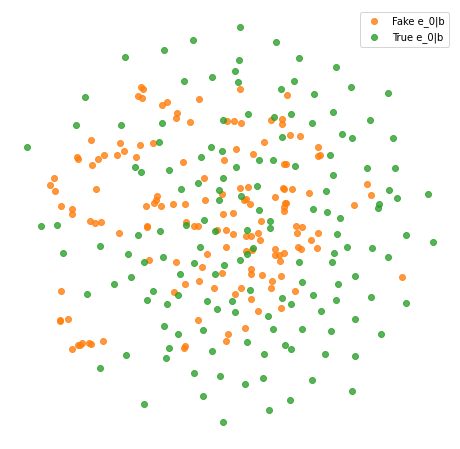

In [35]:
if 'oae' in network_info['model_info']['network_class'].lower():
    plt.figure(figsize=(8, 8))
    plt.scatter(x = latent_tsne[latent_class==0,0], y=latent_tsne[latent_class==0,1], c='C1', label='Fake e_0|b', alpha=0.8)
    plt.scatter(x = latent_tsne[latent_class==1,0], y=latent_tsne[latent_class==1,1], c='C2', label='True e_0|b', alpha=0.8)
    plt.legend()
    plt.axis('off')
    plt.savefig("%s/%s_unknown_within_unit_variation_tsne" % (fig_dir, model_aka), bbox_inches='tight')
    plt.show()

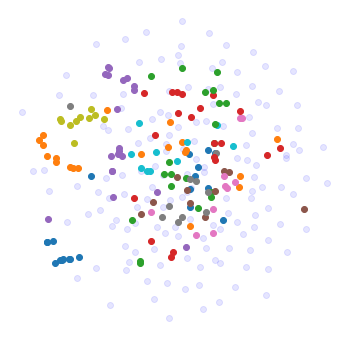

In [36]:
if 'oae' in network_info['model_info']['network_class'].lower():
    plt.figure(figsize=(6, 6))
    plt.scatter(x = latent_tsne[latent_class_y==100000,0], y=latent_tsne[latent_class_y==100000,1], label='True e', alpha=0.1, c='blue')
    for cls in np.unique(latent_class_y)[:-1]:
        plt.scatter(x = latent_tsne[latent_class_y==cls,0], y=latent_tsne[latent_class_y==cls,1], label='Fake e^%s'%cls, alpha=1, cmap='Set3')
    # plt.legend()
    plt.axis('off')
    plt.savefig("%s/%s_unknown_within_unit_variation_tsne_class" % (fig_dir, model_aka), bbox_inches='tight')
    plt.show()

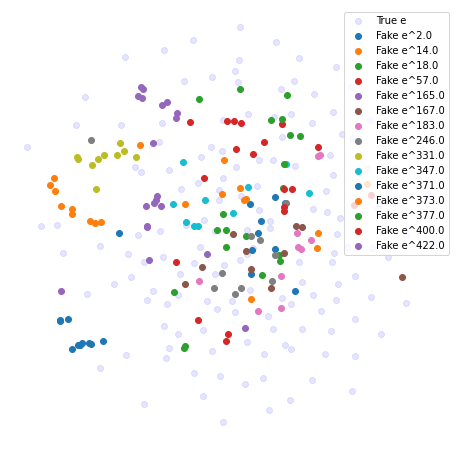

In [37]:
if 'oae' in network_info['model_info']['network_class'].lower():
    plt.figure(figsize=(8, 8))
    plt.scatter(x = latent_tsne[latent_class_y==100000,0], y=latent_tsne[latent_class_y==100000,1], label='True e', alpha=0.1, c='blue')
    for cls in np.unique(latent_class_y)[:-1]:
        plt.scatter(x = latent_tsne[latent_class_y==cls,0], y=latent_tsne[latent_class_y==cls,1], label='Fake e^%s'%cls, alpha=1, cmap='Set3')
    plt.legend()
    plt.axis('off')
    plt.savefig("%s/%s_unknown_within_unit_variation_tsne_class_with_legend" % (fig_dir, model_aka), bbox_inches='tight')
    plt.show()

#### Identity encoder

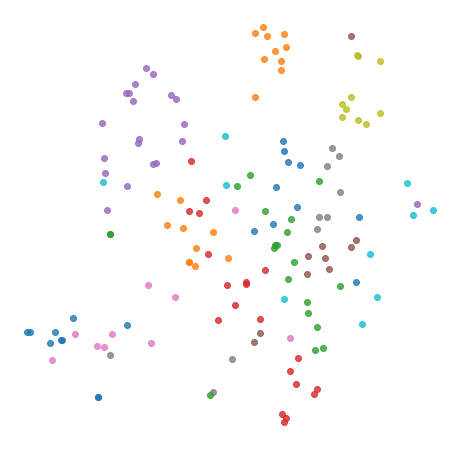

In [38]:
if 'oae' in network_info['model_info']['network_class'].lower():
    picked = np.sum([y==cls for cls in y_class[:15]], axis=0).astype(np.bool)
    picked_y = y[picked]
    picked_estimate_b = estimate_b[picked]
    tsne = TSNE(n_components=2, random_state=0)
    fake_b_tsne = tsne.fit_transform(picked_estimate_b)
    
    plt.figure(figsize=(8, 8))
    for cls in np.unique(picked_y):
        plt.scatter(x=fake_b_tsne[picked_y==cls,0], y=fake_b_tsne[picked_y==cls,1], label=cls, alpha=0.8, cmap=pylab.cm.cool)
    plt.axis('off')
    plt.savefig("%s/%s_unknown_identity_tsne" % (fig_dir, model_aka), bbox_inches='tight')
    plt.show()

#### Fake latent

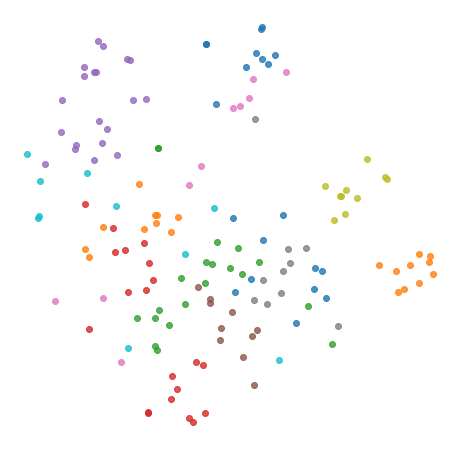

In [39]:
if 'oae' in network_info['model_info']['network_class'].lower():
    fake_latent = np.concatenate([estimate_b, fake_noise], axis=-1)
    
    picked = np.sum([y==cls for cls in y_class], axis=0).astype(np.bool)
    picked_y = y[picked]
    picked_fake_noise = fake_latent[picked]
    tsne = TSNE(n_components=2, random_state=0)
    fake_noise = tsne.fit_transform(picked_fake_noise)
    
    plt.figure(figsize=(8, 8))
    for cls in np.unique(picked_y):
        plt.scatter(x=fake_noise[picked_y==cls,0], y=fake_noise[picked_y==cls,1], label=cls, alpha=0.8, cmap=pylab.cm.cool)
    plt.axis('off')
    plt.savefig("%s/%s_unknown_fake_latent_tsne" % (fig_dir, model_aka), bbox_inches='tight')
    plt.show()